In [186]:
import airportsdata
import numpy as np
import networkx as nx
import pandas as pd
import itertools
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import math
airports = airportsdata.load()

In [215]:
def draw_flights_on_map(airline_network, axis,node_size,node_color='red', draw_node=True, draw_edge=True):
    pos = {}
    for i in airline_network:
        longtitude = airports[i]['lon']
        latitude = airports[i]['lat']
        map_long, map_lat = m(longtitude,latitude)
        pos[i] = (longtitude, latitude)
    n_flights = np.fromiter(nx.get_edge_attributes(airline_network, 'value').values(),dtype=int)
    rgba_colors = list(n_flights/np.max(n_flights))
    # edges,n_flights = zip(*nx.get_edge_attributes(g,'value').items())
    if draw_node:
        nx.draw_networkx_nodes(airline_network,pos,
                               nodelist=airline_network.nodes(),
                               node_size=node_size,
                               node_color=node_color,
                               alpha=0.3,
                              ax=axis)
    if draw_edge:
        nx.draw_networkx_edges(airline_network,pos,
                               edgelist = airline_network.edges(),
                               edge_color=rgba_colors,
                               alpha=0.1,
                              ax=axis)
    m.drawcoastlines(ax=axis)

    m.drawcountries(ax=axis)


In [ ]:
g_2019 = nx.read_gml("flightlist_20191201_20191231.gml", label="label")
g_2020_apr = nx.read_gml("flightlist_20200401_20200430.gml", label="label")

# Plot of overall flights on Dec 2019 and Apr 2020

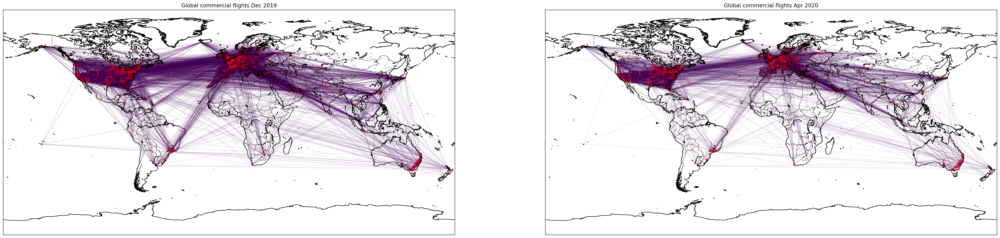

In [208]:
fig, axs = plt.subplots(1,2, figsize=(40,20), dpi=200)
g_2019.remove_edges_from(nx.selfloop_edges(g_2019))
draw_flights_on_map(g_2019,axs[0],3)
axs[0].set_title("Global commercial flights Dec 2019")
g_2020_apr.remove_edges_from(nx.selfloop_edges(g_2020_apr))
axs[1].set_title("Global commercial flights Apr 2020")
draw_flights_on_map(g_2020_apr,axs[1],3)


In [235]:
# Get euclidean distance between two airports
def get_distance_km(a_i, a_j, mode):
    if mode == 'weighted':
        long_1 = airports[a_i]['lon']
        long_2 = airports[a_j]['lon']
        lat_1 = airports[a_i]['lat']
        lat_2 = airports[a_j]['lat']
        return math.sqrt(((long_2 - long_1)**2) + ((lat_2 - lat_1)**2))
    elif mode == 'topology':
        return 1
    else:
        raise Exception('Unknown calculation mode')
get_distance_km('LIMC','LSZH','topology') 

1

In [253]:
# Calculate s_i
def s_i(g, node_name, mode):
    result = []
    for n in g[node_name]:
        result.append(1.0/get_distance_km(node_name, n, mode))
    if np.array(result).sum() == 0:
        return 1
    else:
        return np.array(result).sum()
s_i(g_2019,'LSZH','weighted')

43.473867900755685

0

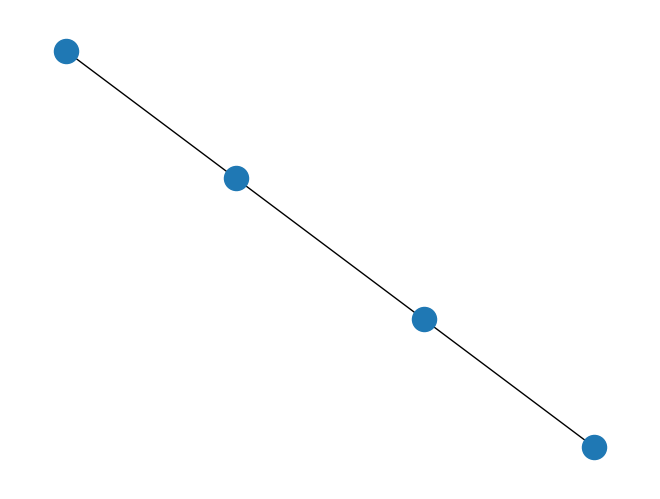

In [149]:
# Helper function determining if three nodes forms a triangle
def is_triangle(g, n_i, n_j, n_h):
    return 1 if n_i in g[n_j] and n_j in g[n_h] and n_h in g[n_i] else 0
G=nx.Graph()
G.add_edge('a','b',weight=1)
G.add_edge('a','c',weight=1)
G.add_edge('c','d',weight=1)
nx.draw(G)
is_triangle(G,'a','b','c')

In [251]:
def get_clustering_coefficient(g, mode='weighted'):
    result = {}
    for n_i in g:
        sum_of_neigh = 0
        neighbor_combs = [x for x in itertools.combinations(g[n_i], r=2)]
        for (n_j, n_h) in neighbor_combs:
            sum_of_neigh += (1.0/get_distance_km(n_i, n_j, mode) + 1.0/get_distance_km(n_i, n_h, mode)) / 2 * is_triangle(g, n_i, n_j, n_h)
        if s_i(g, n_i, mode) == 0:
            print("s_i is zero")
        i_degree_minus_1 = 1 if g.degree(n_i) - 1 == 0 else g.degree(n_i) - 1
        sum_of_neigh *= 1/(s_i(g, n_i, mode) * i_degree_minus_1)
        result[n_i] = sum_of_neigh
    return result

In [254]:
C_w = get_clustering_coefficient(g_2019)
C_c = get_clustering_coefficient(g_2019, mode='topology')

In [255]:
C_w_arr = pd.Series(C_w)
C_c_arr = pd.Series(C_c)
nodes_peri = C_w_arr.index[C_w_arr == 0].to_list()
nodes_local = C_w_arr.index[C_w_arr > C_c_arr].to_list()
nodes_global = C_w_arr.index[C_w_arr <= C_c_arr].to_list()

# Plot of peripheral, local, global clusters Dec 2019

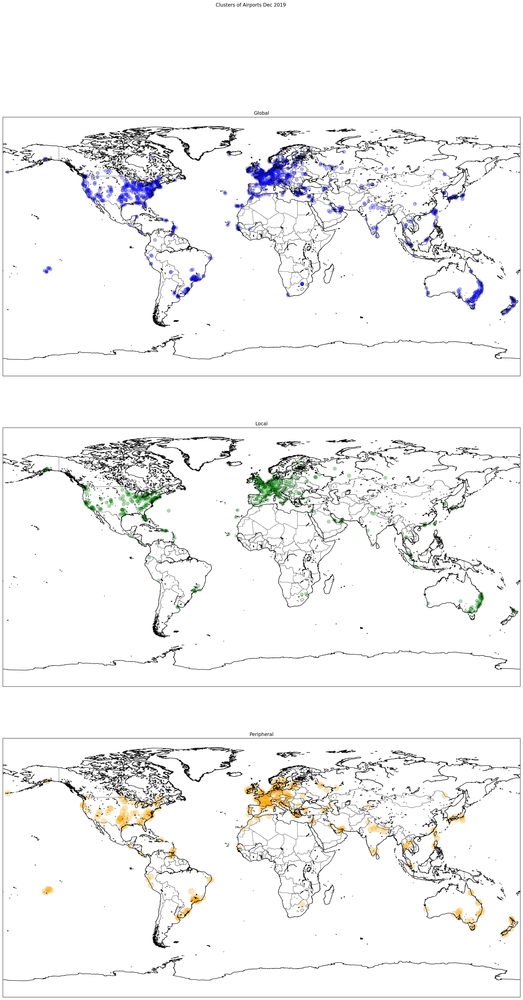

In [256]:
fig, axs = plt.subplots(3, figsize=(30,40), dpi=200)
fig.suptitle("Clusters of Airports Dec 2019")
axs[0].set_title("Global")
draw_flights_on_map(g_2019.subgraph(nodes_global), axs[0], 70,draw_edge=False, node_color='blue')
axs[1].set_title("Local")
draw_flights_on_map(g_2019.subgraph(nodes_local), axs[1], 70,draw_edge=False, node_color='green')
axs[2].set_title("Peripheral")
draw_flights_on_map(g_2019.subgraph(nodes_peri), axs[2], 200,draw_edge=False, node_color='orange')

# Plot of peripheral, local, global clusters Apr 2020

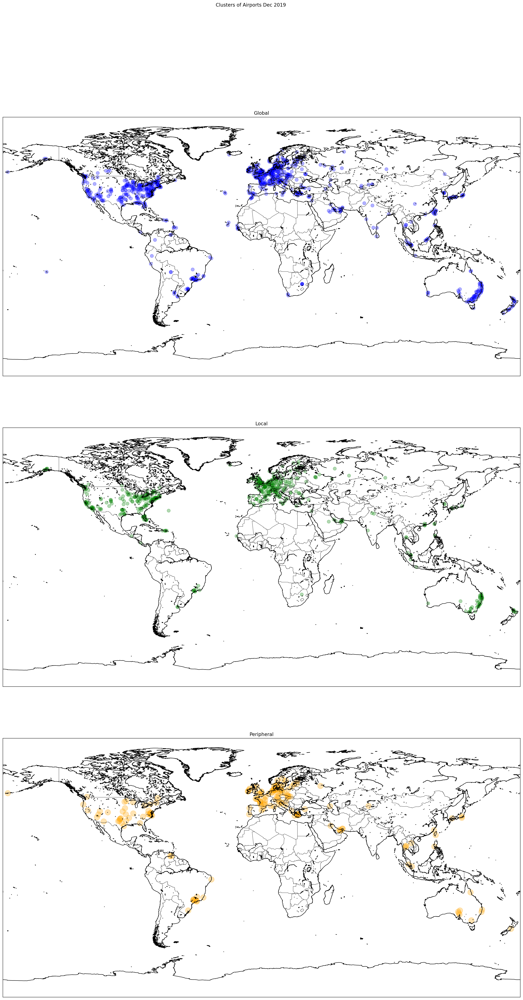

In [258]:
fig, axs = plt.subplots(3, figsize=(30,40), dpi=200)
fig.suptitle("Clusters of Airports Dec 2019")
axs[0].set_title("Global")
draw_flights_on_map(g_2020_apr.subgraph(nodes_global), axs[0], 70,draw_edge=False, node_color='blue')
axs[1].set_title("Local")
draw_flights_on_map(g_2020_apr.subgraph(nodes_local), axs[1], 70,draw_edge=False, node_color='green')
axs[2].set_title("Peripheral")
draw_flights_on_map(g_2020_apr.subgraph(nodes_peri), axs[2], 200,draw_edge=False, node_color='orange')